In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('Bina_data_az.csv')
df

,Url,Kateqoriya,Mərtəbə,Sahə,Otaq_sayı,Çıxarış,İpoteka,Təmir,Qiymət,Qiymət_1_m2,Ünvan
0,https://bina.az/items/4924857,Yeni tikili,6 / 7,57.5 m²,1,yoxdur,Yox,yoxdur,185 000,3 220 AZN/m²,"Satılır 1 otaqlı yeni tikili 57.5 m², Nardaran q."
1,https://bina.az/items/4960092,Yeni tikili,3 / 14,45.5 m²,1,yoxdur,Yox,yoxdur,120 575,2 650 AZN/m²,"Satılır 1 otaqlı yeni tikili 45.5 m², Azadlıq ..."
2,https://bina.az/items/4672911,Yeni tikili,1 / 7,49 m²,1,yoxdur,var,yoxdur,210 000,4 290 AZN/m²,"Satılır 1 otaqlı yeni tikili 49 m², Nardaran q."
3,https://bina.az/items/4558588,Yeni tikili,4 / 5,46 m²,1,yoxdur,Yox,var,238 000,5 170 AZN/m²,"Satılır 1 otaqlı yeni tikili 46 m², Nardaran q."
4,https://bina.az/items/5018288,Yeni tikili,7 / 16,34 m²,1,var,var,var,129 000,3 790 AZN/m²,"Satılır 1 otaqlı yeni tikili 34 m², Nərimanov r."
...,...,...,...,...,...,...,...,...,...,...,...
46873,https://bina.az/items/4950929,Köhnə tikili,4 / 9,120 m²,5,var,Yox,var,190 000,1 580 AZN/m²,"Satılır 5 otaqlı köhnə tikili 120 m², Əhmədli m."
46874,https://bina.az/items/4608998,Köhnə tikili,3 / 9,120 m²,5,var,var,var,226 000,1 880 AZN/m²,"Satılır 5 otaqlı köhnə tikili 120 m², Əhmədli m."
46875,https://bina.az/items/4910449,Köhnə tikili,8 / 9,120 m²,5,var,var,var,245 000,2 040 AZN/m²,"Satılır 5 otaqlı köhnə tikili 120 m², Əhmədli m."
46876,https://bina.az/items/4950490,Köhnə tikili,9 / 9,110 m²,5,var,var,var,155 000,1 410 AZN/m²,"Satılır 5 otaqlı köhnə tikili 110 m², Xətai r."


In [ ]:
df.columns = df.columns.str.lower()

In [ ]:
df.columns

Index(['url', 'kateqoriya', 'mərtəbə', 'sahə', 'otaq_sayı', 'çıxarış',
       'i̇poteka', 'təmir', 'qiymət', 'qiymət_1_m2', 'ünvan'],
      dtype='object')

In [ ]:
df.drop(columns=['url'], inplace=True)

In [ ]:
df['address'] = df['ünvan'].str.split(', ').str[1]
df.drop(columns=['ünvan'], inplace=True)

In [ ]:
df[['apartment_floor', 'building_floor']] = df.mərtəbə.str.split("/", expand=True).astype(int)

df.drop(columns=['mərtəbə'], inplace=True)

In [ ]:
df['category'] = np.where(df['kateqoriya']=='Yeni tikili', 1, 0)
df.drop(columns=['kateqoriya'], inplace=True)

In [ ]:
def value_binary(data, columns):
    for column in columns:
        data[column] = np.where(data[column] == 'var', 1, 0)
        
    return data
    

In [ ]:
columns = ['çıxarış', 'i̇poteka', 'təmir']

value_binary(df, columns)

,sahə,otaq_sayı,çıxarış,i̇poteka,təmir,qiymət,qiymət_1_m2,address,apartment_floor,building_floor,category
0,57.5 m²,1,0,0,0,185 000,3 220 AZN/m²,Nardaran q.,6,7,1
1,45.5 m²,1,0,0,0,120 575,2 650 AZN/m²,Azadlıq Prospekti m.,3,14,1
2,49 m²,1,0,1,0,210 000,4 290 AZN/m²,Nardaran q.,1,7,1
3,46 m²,1,0,0,1,238 000,5 170 AZN/m²,Nardaran q.,4,5,1
4,34 m²,1,1,1,1,129 000,3 790 AZN/m²,Nərimanov r.,7,16,1
...,...,...,...,...,...,...,...,...,...,...,...
46873,120 m²,5,1,0,1,190 000,1 580 AZN/m²,Əhmədli m.,4,9,0
46874,120 m²,5,1,1,1,226 000,1 880 AZN/m²,Əhmədli m.,3,9,0
46875,120 m²,5,1,1,1,245 000,2 040 AZN/m²,Əhmədli m.,8,9,0
46876,110 m²,5,1,1,1,155 000,1 410 AZN/m²,Xətai r.,9,9,0


In [ ]:
df['price_azn_1m2'] = df['qiymət_1_m2'].str.replace(r'[^\d.]', '', regex=True).astype(int)
df.drop(columns=['qiymət_1_m2'], inplace=True)

In [ ]:
df.head()

,sahə,otaq_sayı,çıxarış,i̇poteka,təmir,qiymət,address,apartment_floor,building_floor,category,price_azn_1m2
0,57.5 m²,1,0,0,0,185 000,Nardaran q.,6,7,1,3220
1,45.5 m²,1,0,0,0,120 575,Azadlıq Prospekti m.,3,14,1,2650
2,49 m²,1,0,1,0,210 000,Nardaran q.,1,7,1,4290
3,46 m²,1,0,0,1,238 000,Nardaran q.,4,5,1,5170
4,34 m²,1,1,1,1,129 000,Nərimanov r.,7,16,1,3790


In [ ]:
df['area_m2'] = df['sahə'].str.split(" ").str[0]
df.drop(columns=['sahə'], inplace=True)
df['area_m2'] = df.area_m2.astype(float)

In [ ]:
df['price'] = df['qiymət'].str.replace(' ', '').astype(int)
df.drop(columns=['qiymət'], inplace=True)

In [ ]:
df.rename(columns = {'otaq_sayı' : 'room_number', 'çıxarış':'title_deed', 'i̇poteka': 'mortgage', 'təmir':'repair'}, inplace=True)

In [ ]:
df.dtypes

room_number          int64
title_deed           int32
mortgage             int32
repair               int32
address             object
apartment_floor      int32
building_floor       int32
category             int32
price_azn_1m2        int32
area_m2            float64
price                int32
dtype: object

In [ ]:
df.isna().sum()

room_number        0
title_deed         0
mortgage           0
repair             0
address            0
apartment_floor    0
building_floor     0
category           0
price_azn_1m2      0
area_m2            0
price              0
dtype: int64

#### Exlcusions
* Defining which kind of flats are my point of interest and exclude others

In [ ]:
pd.set_option('display.max_rows', None)
df.loc[df.price_azn_1m2 > 4000, 'address'].value_counts().reset_index()

,address,count
0,Ağ şəhər q.,429
1,28 May m.,156
2,Elmlər Akademiyası m.,154
3,Sahil m.,153
4,Nəsimi r.,149
5,Nardaran q.,123
6,Şah İsmayıl Xətai m.,118
7,İçəri Şəhər m.,109
8,Nizami m.,75
9,Xətai r.,74


In [ ]:
addresses = ['Ağ şəhər q.', '28 May m.', 'Elmlər Akademiyası m.', 'Sahil m.', 'Nəsimi r.', 'Nardaran q.', 'Şah İsmayıl Xətai m.', 'İçəri Şəhər m.', 'Nizami m.', 'Xətai r.', 'Nəriman Nərimanov m.', 'Gənclik m.', 'Nərimanov r.', 'Səbail r.']

df_p = df[df.address.isin(addresses)]
df_p.head()

,room_number,title_deed,mortgage,repair,address,apartment_floor,building_floor,category,price_azn_1m2,area_m2,price
0,1,0,0,0,Nardaran q.,6,7,1,3220,57.5,185000
2,1,0,1,0,Nardaran q.,1,7,1,4290,49.0,210000
3,1,0,0,1,Nardaran q.,4,5,1,5170,46.0,238000
4,1,1,1,1,Nərimanov r.,7,16,1,3790,34.0,129000
6,1,0,0,1,Nərimanov r.,16,20,1,3310,65.0,215000
7,1,0,1,1,Nardaran q.,1,4,1,3920,55.5,217357
8,1,0,1,1,Nardaran q.,3,4,1,5780,42.8,247211
9,1,0,1,1,Nardaran q.,2,7,1,5440,54.9,298656
10,1,0,1,1,Nardaran q.,4,7,1,5610,55.3,310233
11,1,0,1,1,Nardaran q.,5,7,1,5950,53.5,318325


In [ ]:
df_p.shape

(20076, 11)

In [ ]:
mean_prices =(
            df_p
            .groupby('address')['price_azn_1m2'] 
            .mean()
            .sort_values(ascending=False)
            .round()
            )
mean_prices.reset_index().rename(columns={'price_azn_1m2':'mean_price'})

,address,mean_price
0,Nardaran q.,4303.0
1,Ağ şəhər q.,4274.0
2,Sahil m.,4002.0
3,İçəri Şəhər m.,3403.0
4,Səbail r.,3034.0
5,28 May m.,3015.0
6,Nəsimi r.,2990.0
7,Nizami m.,2943.0
8,Elmlər Akademiyası m.,2920.0
9,Şah İsmayıl Xətai m.,2899.0


In [ ]:
df_p['address'] = df_p['address'].replace({
    'Nəriman Nərimanov m.' : 'Gənclik_Nərimanov_m.',
    'Gənclik m.' : 'Gənclik_Nərimanov_m.',
    'Şah İsmayıl Xətai m.' : 'Elmlər_Nizami_Xətai_m.',
    'Elmlər Akademiyası m.' : 'Elmlər_Nizami_Xətai_m.',
    'Nizami m.' : 'Elmlər_Nizami_Xətai_m.',
    'Nardaran q.' : 'Nardaran_AgSheher_q.',
    'Ağ şəhər q.' : 'Nardaran_AgSheher_q.',
    'Səbail r.' : 'Səbail_Nəsimi_r.',
    'Nəsimi r.' : 'Səbail_Nəsimi_r.'
})

C:\Users\nicat_pc\AppData\Local\Temp\ipykernel_1596\3687516760.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p['address'] = df_p['address'].replace({


In [ ]:
dummies = pd.get_dummies(df_p.select_dtypes(include='object'), drop_first = True).astype(int)
dummies = pd.get_dummies(df_p['address'], prefix = '', prefix_sep = '')
dummies.columns = dummies.columns.str.replace(' ', '_')
dummies.head()

,28_May_m.,Elmlər_Nizami_Xətai_m.,Gənclik_Nərimanov_m.,Nardaran_AgSheher_q.,Nərimanov_r.,Sahil_m.,Səbail_Nəsimi_r.,Xətai_r.,İçəri_Şəhər_m.
0,False,False,False,True,False,False,False,False,False
2,False,False,False,True,False,False,False,False,False
3,False,False,False,True,False,False,False,False,False
4,False,False,False,False,True,False,False,False,False
6,False,False,False,False,True,False,False,False,False


In [ ]:
df_p = pd.concat([df_p, dummies], axis=1)
df_p.head()

,room_number,title_deed,mortgage,repair,address,apartment_floor,building_floor,category,price_azn_1m2,area_m2,price,28_May_m.,Elmlər_Nizami_Xətai_m.,Gənclik_Nərimanov_m.,Nardaran_AgSheher_q.,Nərimanov_r.,Sahil_m.,Səbail_Nəsimi_r.,Xətai_r.,İçəri_Şəhər_m.
0,1,0,0,0,Nardaran_AgSheher_q.,6,7,1,3220,57.5,185000,False,False,False,True,False,False,False,False,False
2,1,0,1,0,Nardaran_AgSheher_q.,1,7,1,4290,49.0,210000,False,False,False,True,False,False,False,False,False
3,1,0,0,1,Nardaran_AgSheher_q.,4,5,1,5170,46.0,238000,False,False,False,True,False,False,False,False,False
4,1,1,1,1,Nərimanov r.,7,16,1,3790,34.0,129000,False,False,False,False,True,False,False,False,False
6,1,0,0,1,Nərimanov r.,16,20,1,3310,65.0,215000,False,False,False,False,True,False,False,False,False


In [ ]:
df_p['is_metro'] = df_p['address'].str.endswith('m.').astype(int)
df_p['is_town'] = (~df_p['address'].str.endswith('m.')).astype(int)

In [ ]:
df_p.head()

,room_number,title_deed,mortgage,repair,address,apartment_floor,building_floor,category,price_azn_1m2,area_m2,...,Elmlər_Nizami_Xətai_m.,Gənclik_Nərimanov_m.,Nardaran_AgSheher_q.,Nərimanov_r.,Sahil_m.,Səbail_Nəsimi_r.,Xətai_r.,İçəri_Şəhər_m.,is_metro,is_town
0,1,0,0,0,Nardaran_AgSheher_q.,6,7,1,3220,57.5,...,False,False,True,False,False,False,False,False,0,1
2,1,0,1,0,Nardaran_AgSheher_q.,1,7,1,4290,49.0,...,False,False,True,False,False,False,False,False,0,1
3,1,0,0,1,Nardaran_AgSheher_q.,4,5,1,5170,46.0,...,False,False,True,False,False,False,False,False,0,1
4,1,1,1,1,Nərimanov r.,7,16,1,3790,34.0,...,False,False,False,True,False,False,False,False,0,1
6,1,0,0,1,Nərimanov r.,16,20,1,3310,65.0,...,False,False,False,True,False,False,False,False,0,1


#### EDA
* Correlation Analysis
* Scatter and other plots
* Plots to show relationship between each variable and dependent variable(price)

In [ ]:
df_p.select_dtypes(include=['number']).corr()

,room_number,title_deed,mortgage,repair,apartment_floor,building_floor,category,price_azn_1m2,area_m2,price,is_metro,is_town
room_number,1.000000,0.106013,0.042377,-0.116415,0.096219,0.097230,0.102516,-0.094663,0.800347,0.632480,0.032598,-0.032598
title_deed,0.106013,1.000000,0.412934,0.320853,-0.042728,-0.092962,-0.260672,-0.114937,0.051816,-0.004881,0.124894,-0.124894
mortgage,0.042377,0.412934,1.000000,0.152304,0.074015,0.125011,0.085872,-0.083688,0.031832,-0.014717,-0.002115,0.002115
repair,-0.116415,0.320853,0.152304,1.000000,-0.084939,-0.099058,-0.215471,0.047285,-0.224552,-0.170578,0.064900,-0.064900
apartment_floor,0.096219,-0.042728,0.074015,-0.084939,1.000000,0.583696,0.411630,-0.070358,0.207379,0.124665,-0.017240,0.017240
building_floor,0.097230,-0.092962,0.125011,-0.099058,0.583696,1.000000,0.714533,-0.036417,0.262577,0.196892,-0.005794,0.005794
category,0.102516,-0.260672,0.085872,-0.215471,0.411630,0.714533,1.000000,0.064738,0.288422,0.250425,-0.120695,0.120695
price_azn_1m2,-0.094663,-0.114937,-0.083688,0.047285,-0.070358,-0.036417,0.064738,1.000000,-0.067456,0.455791,-0.038910,0.038910
area_m2,0.800347,0.051816,0.031832,-0.224552,0.207379,0.262577,0.288422,-0.067456,1.000000,0.790843,0.016404,-0.016404
price,0.632480,-0.004881,-0.014717,-0.170578,0.124665,0.196892,0.250425,0.455791,0.790843,1.000000,-0.016431,0.016431


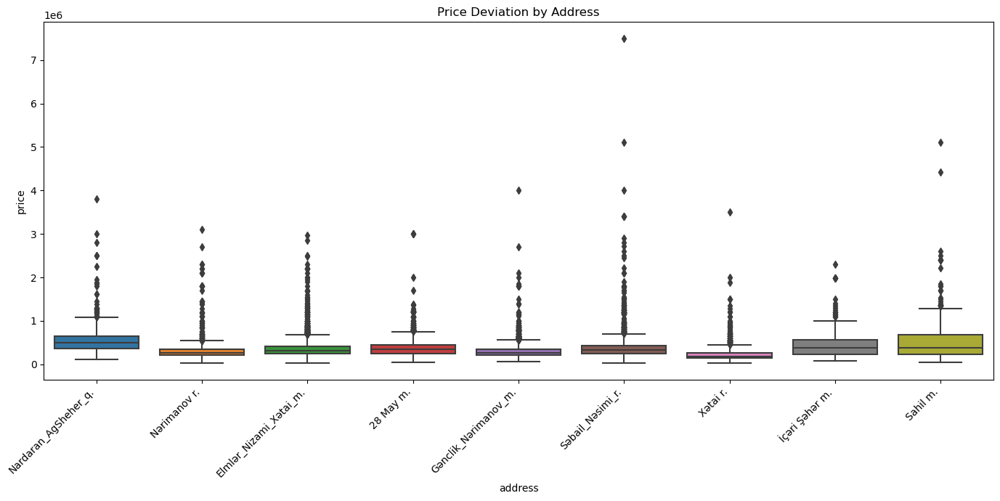

In [ ]:
plt.figure(figsize=(14,7))
sns.boxplot(data=df_p, x='address', y='price')
plt.title('Price Deviation by Address')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
df_p.select_dtypes(include=['number']).quantile([0.05, 0.1, 0.25, 0.5, 0.75, 0.80, 0.90, 0.95, 0.995, 1])

,room_number,title_deed,mortgage,repair,apartment_floor,building_floor,category,price_azn_1m2,area_m2,price,is_metro,is_town
0.050,2.0,0.0,0.0,0.0,2.0,5.0,0.0,1960.00,50.000,140000.0,0.0,0.0
0.100,2.0,0.0,0.0,0.0,3.0,5.0,0.0,2150.00,58.000,169000.0,0.0,0.0
0.250,2.0,0.0,0.0,1.0,4.0,10.0,1.0,2450.00,78.000,224433.0,0.0,0.0
0.500,3.0,1.0,0.0,1.0,7.0,16.0,1.0,2850.00,108.000,304000.0,1.0,0.0
0.750,3.0,1.0,1.0,1.0,12.0,17.0,1.0,3330.00,150.000,418200.0,1.0,1.0
0.800,4.0,1.0,1.0,1.0,13.0,18.0,1.0,3470.00,160.000,457000.0,1.0,1.0
0.900,4.0,1.0,1.0,1.0,15.0,20.0,1.0,3910.00,195.000,585000.0,1.0,1.0
0.950,4.0,1.0,1.0,1.0,16.0,20.0,1.0,4450.00,224.000,735000.0,1.0,1.0
0.995,7.0,1.0,1.0,1.0,20.0,27.0,1.0,7006.25,441.625,1700000.0,1.0,1.0
1.000,15.0,1.0,1.0,1.0,27.0,34.0,1.0,28100.00,1250.000,7500000.0,1.0,1.0


In [ ]:
(
    df_p
    .select_dtypes(include=['number'])
    .quantile([0.995, 1])
    .T
    .rename(columns={0.995 : 'quantile_995', 1 : 'quantile_1000'})
    .assign(diff_prop = lambda df_ : ((df_['quantile_1000'] - df_['quantile_995'])/ df_['quantile_995'] * 100).round())
    .sort_values('diff_prop', ascending=False)
)

,quantile_995,quantile_1000,diff_prop
price,1700000.000,7500000.0,341.0
price_azn_1m2,7006.250,28100.0,301.0
area_m2,441.625,1250.0,183.0
room_number,7.000,15.0,114.0
apartment_floor,20.000,27.0,35.0
building_floor,27.000,34.0,26.0
title_deed,1.000,1.0,0.0
mortgage,1.000,1.0,0.0
repair,1.000,1.0,0.0
category,1.000,1.0,0.0


In [ ]:
cols = ['area_m2', 'room_number']

for col in cols:
    
    x = df_p[col].quantile(0.995)
    
    df_p.loc[:, col] = np.where(df_p[col] > x, x, df_p[col])

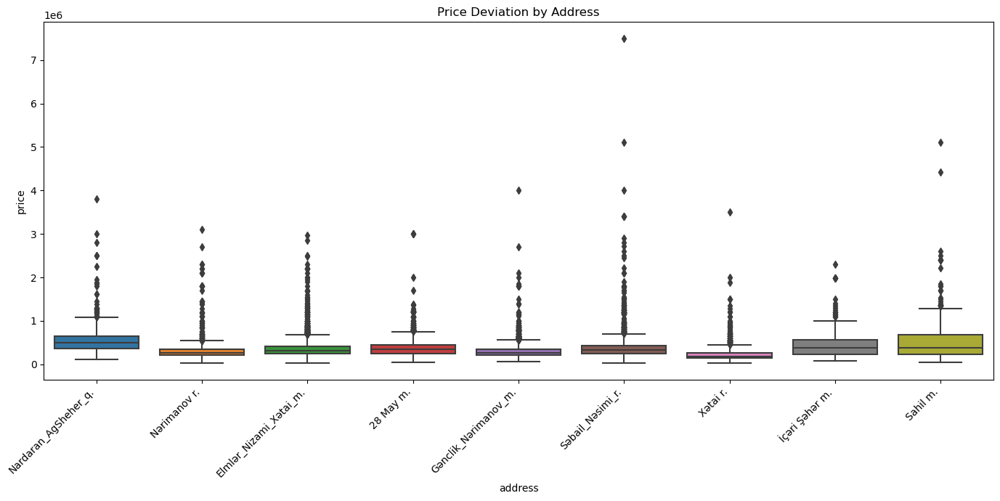

In [ ]:
# By Address
plt.figure(figsize=(14,7))
sns.boxplot(data=df_p, x='address', y='price')
plt.title('Price Deviation by Address')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

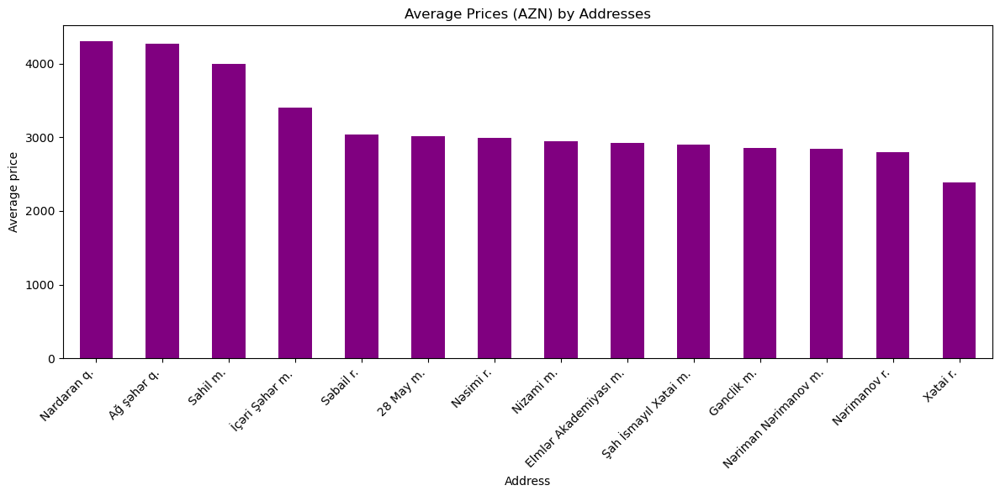

In [ ]:
# Price per 1m2 by Address
plt.figure(figsize=(12,6))
mean_prices.plot(kind='bar', color='purple')
plt.title('Average Prices (AZN) by Addresses')
plt.ylabel('Average price')
plt.xlabel('Address')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

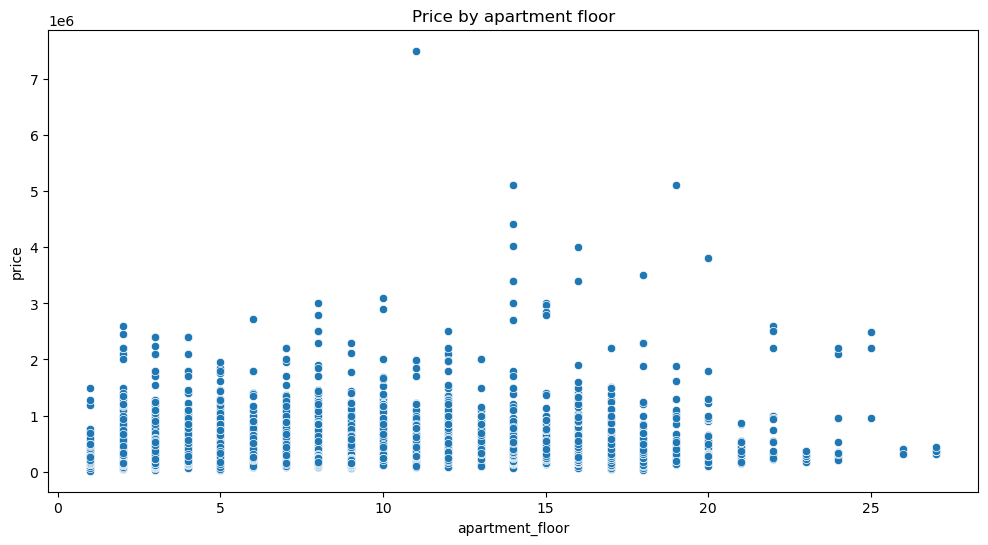

In [ ]:
# By Apartment Floor

plt.figure(figsize=(12,6))
sns.scatterplot(data=df_p, x='apartment_floor', y='price')
plt.title('Price by apartment floor')
plt.show()

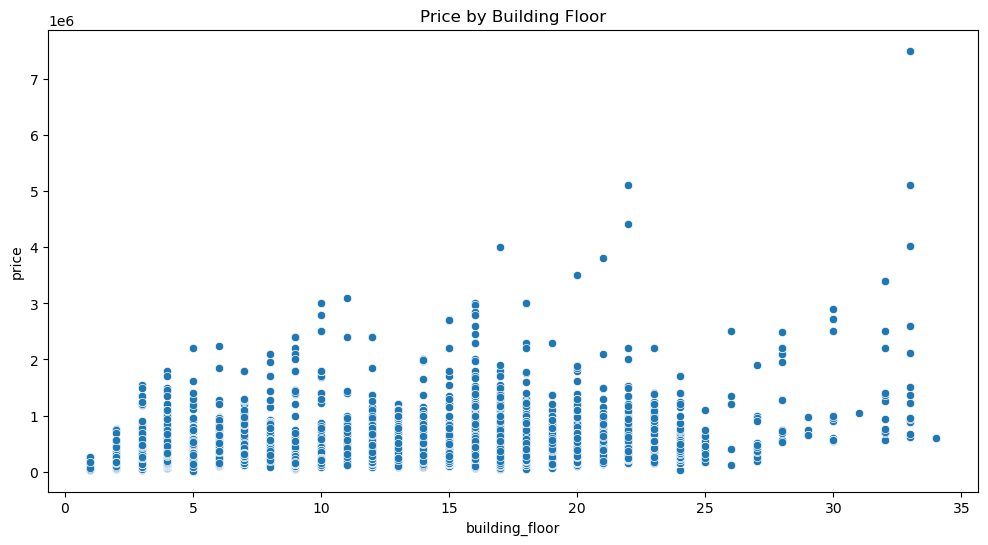

In [ ]:
# By Building floor

plt.figure(figsize=(12,6))
sns.scatterplot(data=df_p, x = 'building_floor', y = 'price')
plt.title('Price by Building Floor')
plt.show()

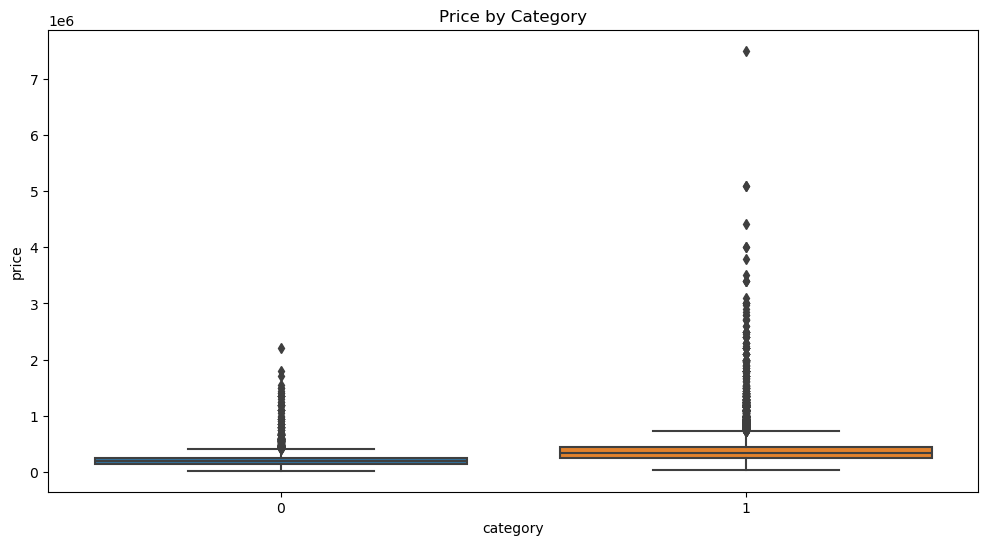

In [ ]:
# By Category 

plt.figure(figsize = (12,6))
sns.boxplot(data = df_p, x = 'category', y = 'price')
plt.title('Price by Category')
plt.show()

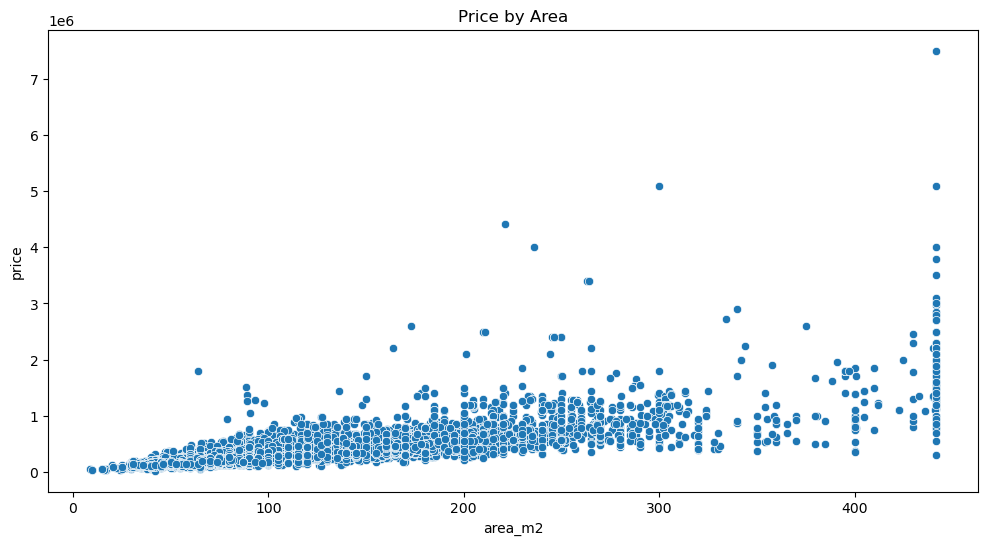

In [ ]:
# Area of 1m2

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'area_m2', y = 'price')
plt.title('Price by Area')
plt.show()

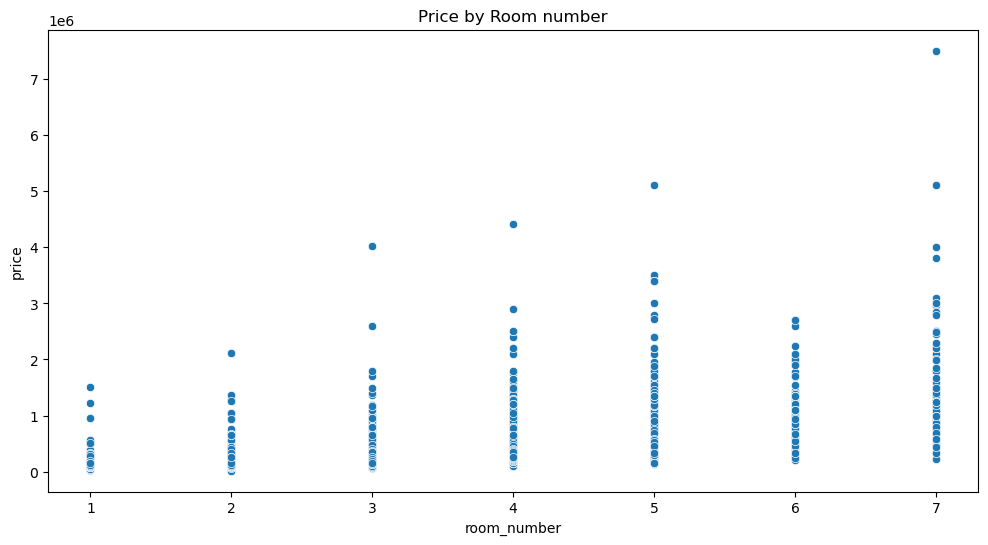

In [ ]:
# By Room Number

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'room_number', y = 'price')
plt.title('Price by Room number')
plt.show()

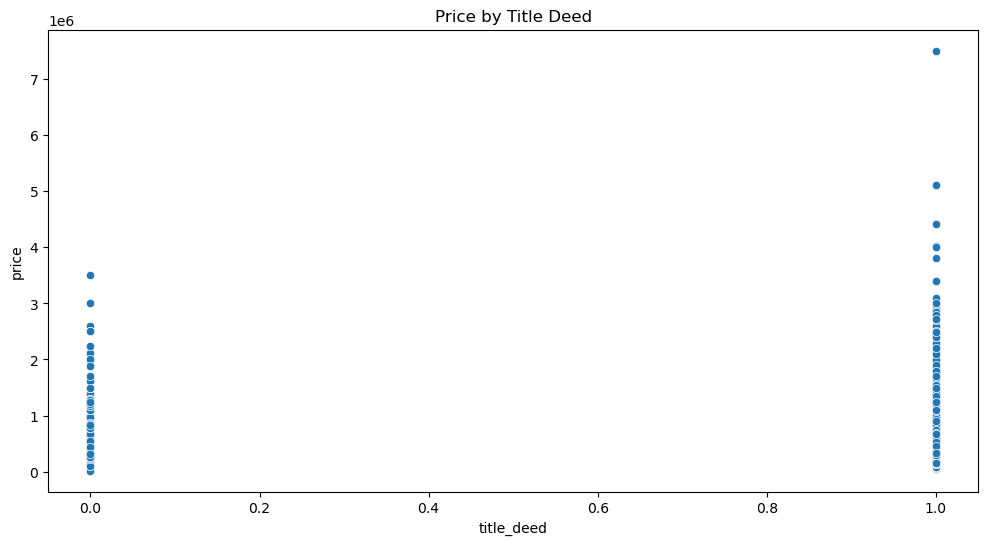

In [ ]:
# By Title deed

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'title_deed', y = 'price')
plt.title('Price by Title Deed')
plt.show()

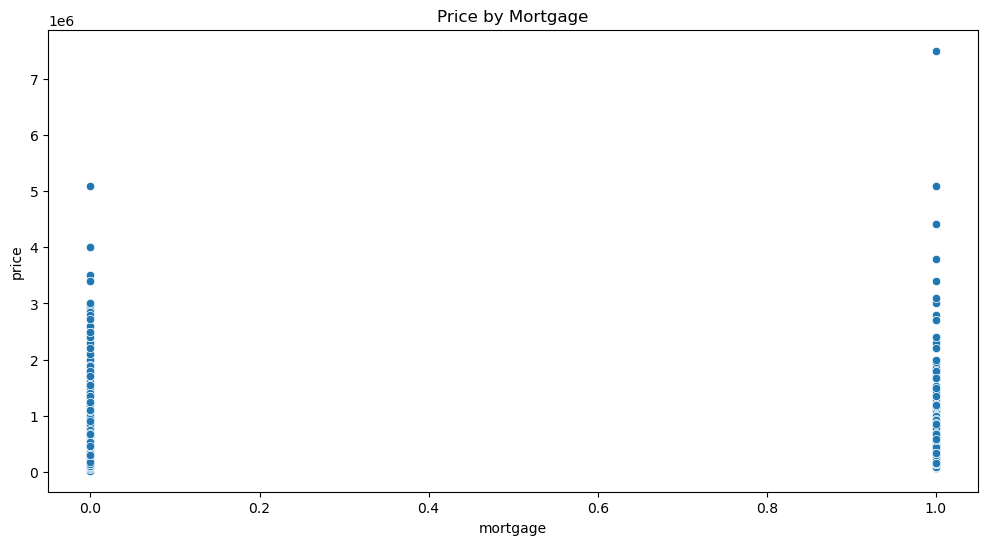

In [ ]:
# By Mortgage

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'mortgage', y = 'price')
plt.title('Price by Mortgage')
plt.show()

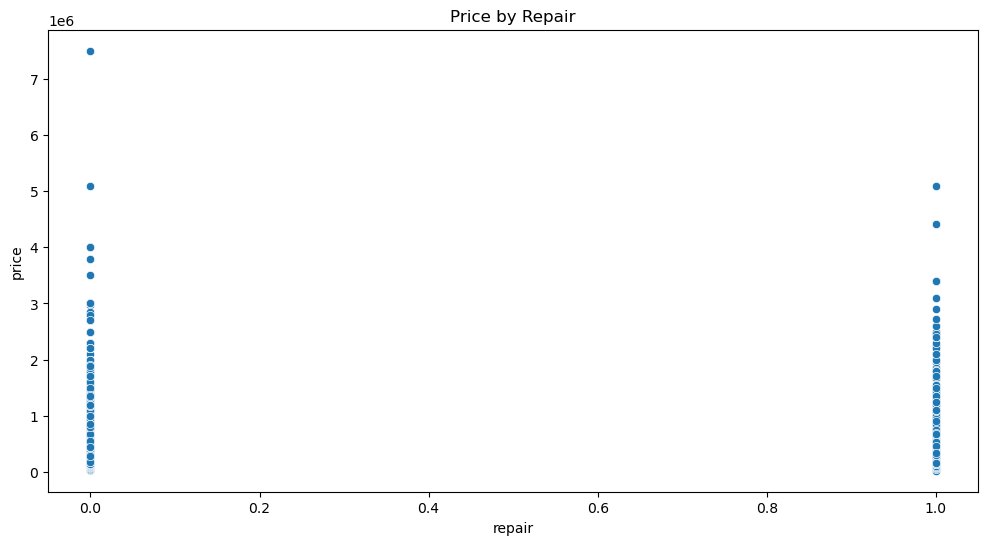

In [ ]:
# By repair

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'repair', y = 'price')
plt.title('Price by Repair')
plt.show()

# Feature Engineering

In [ ]:
df_p['total_ratio'] = df_p['apartment_floor'] / df_p['building_floor']
df_p['total_value_per_m2'] = (df_p.price / df_p.area_m2).round()

In [ ]:
df_p.select_dtypes(include='number').corr()

,room_number,title_deed,mortgage,repair,apartment_floor,building_floor,category,price_azn_1m2,area_m2,price,is_metro,is_town,total_ratio,total_value_per_m2
room_number,1.000000,0.106994,0.044538,-0.114696,0.092157,0.097237,0.104164,-0.097003,0.816027,0.616210,0.032151,-0.032151,0.027009,-0.070719
title_deed,0.106994,1.000000,0.412934,0.320853,-0.042728,-0.092962,-0.260672,-0.114937,0.052565,-0.004881,0.124894,-0.124894,0.040761,-0.110488
mortgage,0.044538,0.412934,1.000000,0.152304,0.074015,0.125011,0.085872,-0.083688,0.038378,-0.014717,-0.002115,0.002115,-0.034536,-0.082613
repair,-0.114696,0.320853,0.152304,1.000000,-0.084939,-0.099058,-0.215471,0.047285,-0.234949,-0.170578,0.064900,-0.064900,-0.008049,0.037976
apartment_floor,0.092157,-0.042728,0.074015,-0.084939,1.000000,0.583696,0.411630,-0.070358,0.207632,0.124665,-0.017240,0.017240,0.646791,-0.059577
building_floor,0.097237,-0.092962,0.125011,-0.099058,0.583696,1.000000,0.714533,-0.036417,0.280800,0.196892,-0.005794,0.005794,-0.166239,-0.028789
category,0.104164,-0.260672,0.085872,-0.215471,0.411630,0.714533,1.000000,0.064738,0.318224,0.250425,-0.120695,0.120695,-0.156338,0.066740
price_azn_1m2,-0.097003,-0.114937,-0.083688,0.047285,-0.070358,-0.036417,0.064738,1.000000,-0.072174,0.455791,-0.038910,0.038910,-0.035461,0.989513
area_m2,0.816027,0.052565,0.038378,-0.234949,0.207632,0.280800,0.318224,-0.072174,1.000000,0.770693,0.016942,-0.016942,0.002256,-0.037247
price,0.616210,-0.004881,-0.014717,-0.170578,0.124665,0.196892,0.250425,0.455791,0.770693,1.000000,-0.016431,0.016431,-0.013452,0.514231


* Take log, exp and quadratic transformation of room number, building_floor, apartment_floor
* Ask chatgpt and think of interaction variable or what sort of further variables, ratios can be derived

In [ ]:
# log, exp and quadratic transformation of room number, building_floor, apartment_floor

cols_to_transform = ['room_number', 'building_floor', 'apartment_floor']

for col in cols_to_transform:
    df_p[f'{col}_log'] = np.log1p(df_p[col])
    
    df_p[f'{col}_exp'] = np.exp(df_p[col])
    
    df_p[f'{col}_squared'] = df_p[col] ** 2
    

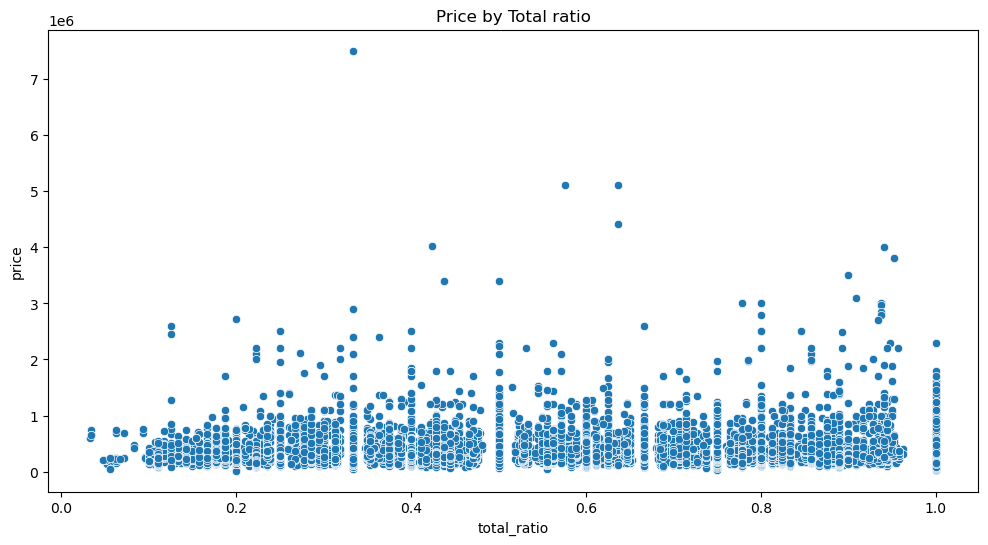

In [ ]:
# By Total Ratio

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'total_ratio', y = 'price')
plt.title('Price by Total ratio')
plt.show()

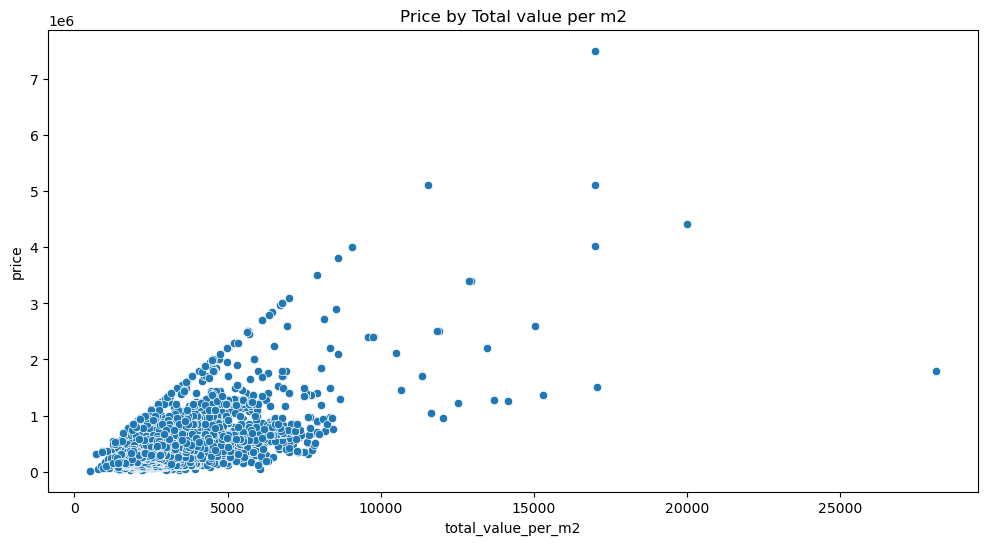

In [ ]:
# By total_value_per_m2

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'total_value_per_m2', y = 'price')
plt.title('Price by Total value per m2')
plt.show()

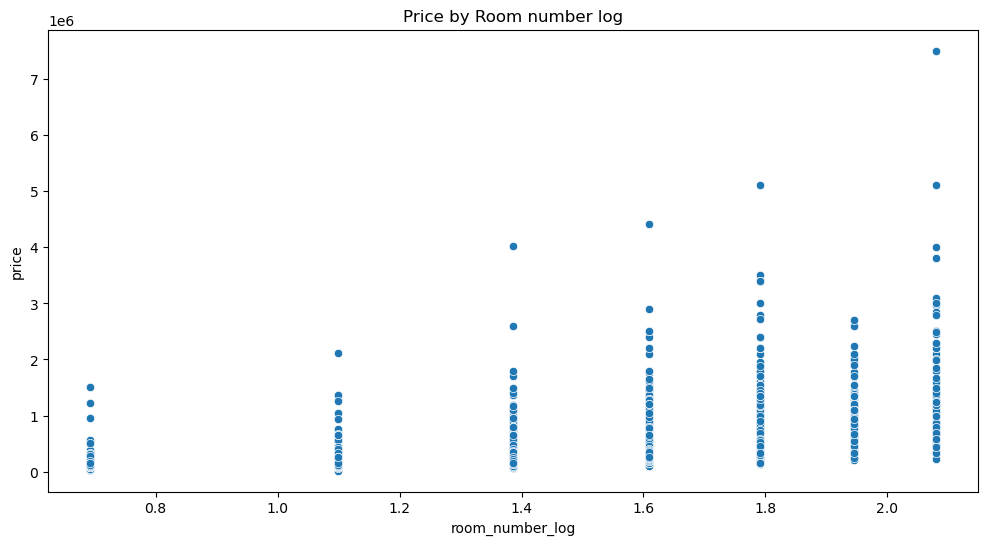

In [ ]:
# By room number log

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'room_number_log', y = 'price')
plt.title('Price by Room number log')
plt.show()

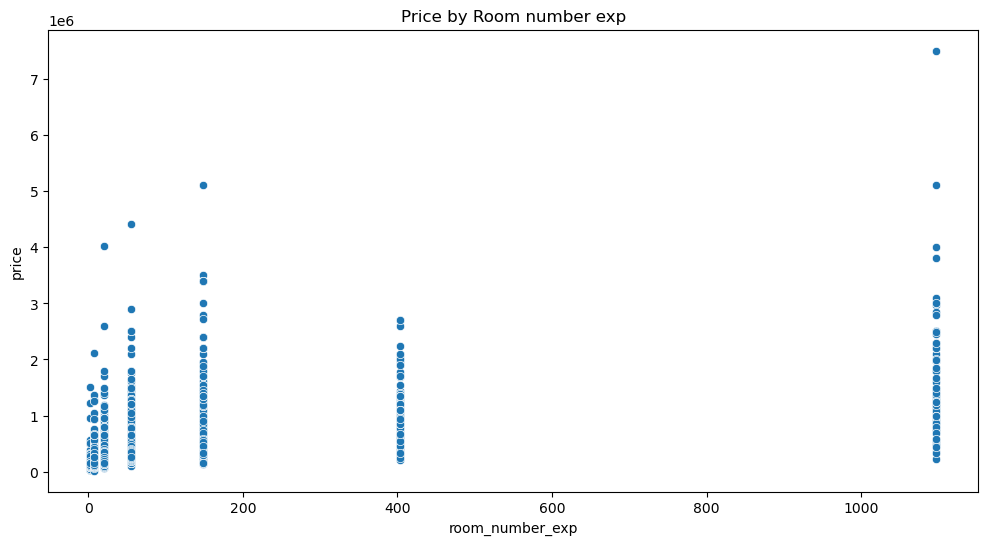

In [ ]:
# By Room number exp

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'room_number_exp', y = 'price')
plt.title('Price by Room number exp')
plt.show()

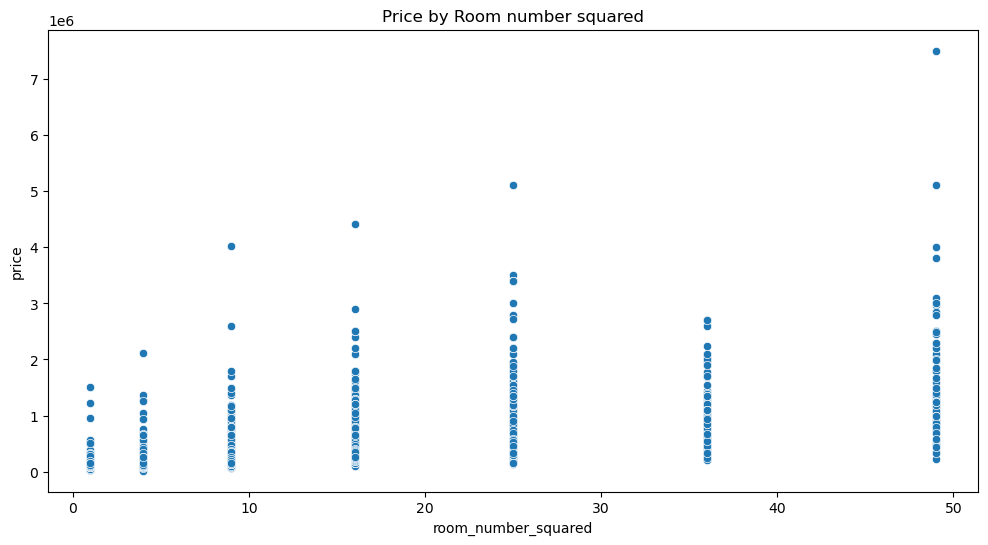

In [ ]:
# By Room number squared

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'room_number_squared', y = 'price')
plt.title('Price by Room number squared')
plt.show()

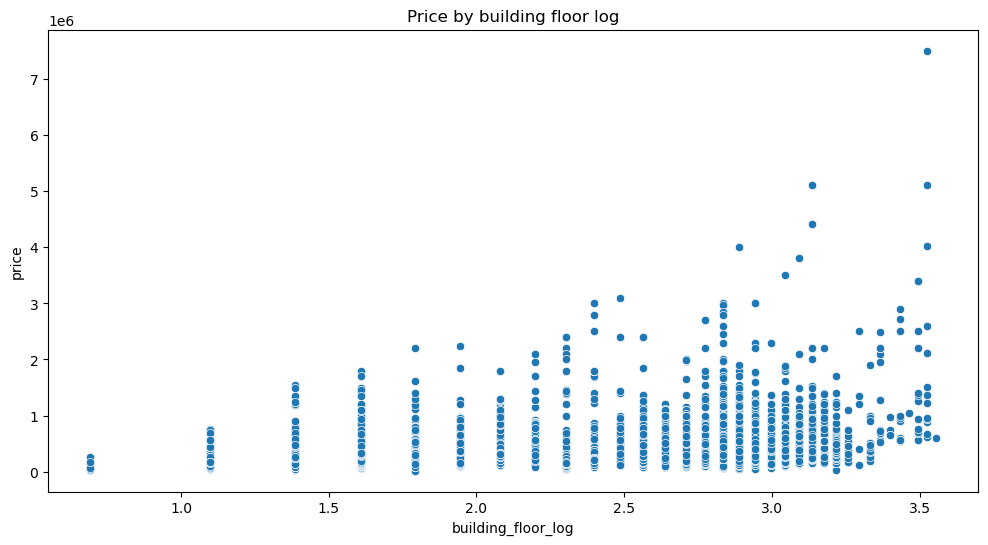

In [ ]:
# By building floor log

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'building_floor_log', y = 'price')
plt.title('Price by building floor log')
plt.show()

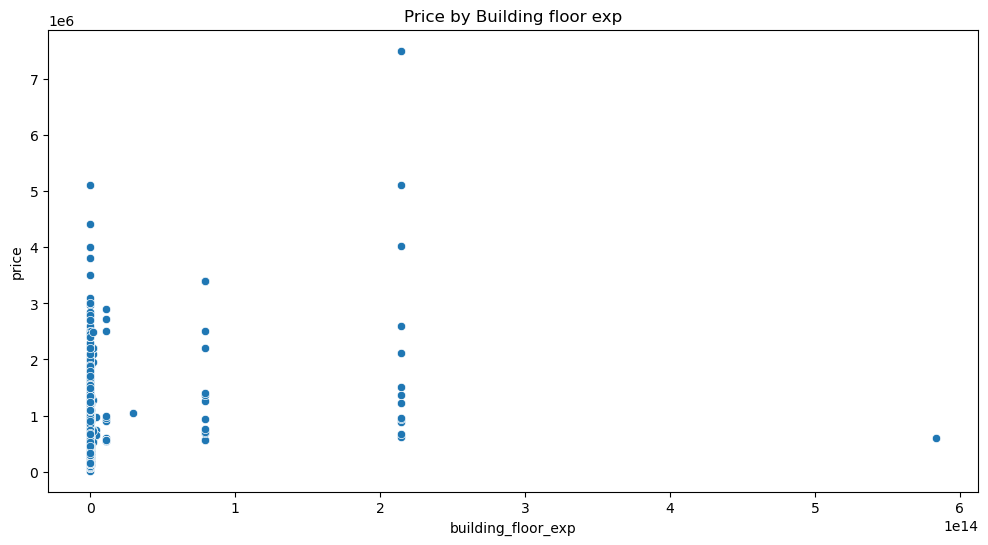

In [ ]:
# By building floor exp

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'building_floor_exp', y = 'price')
plt.title('Price by Building floor exp')
plt.show()

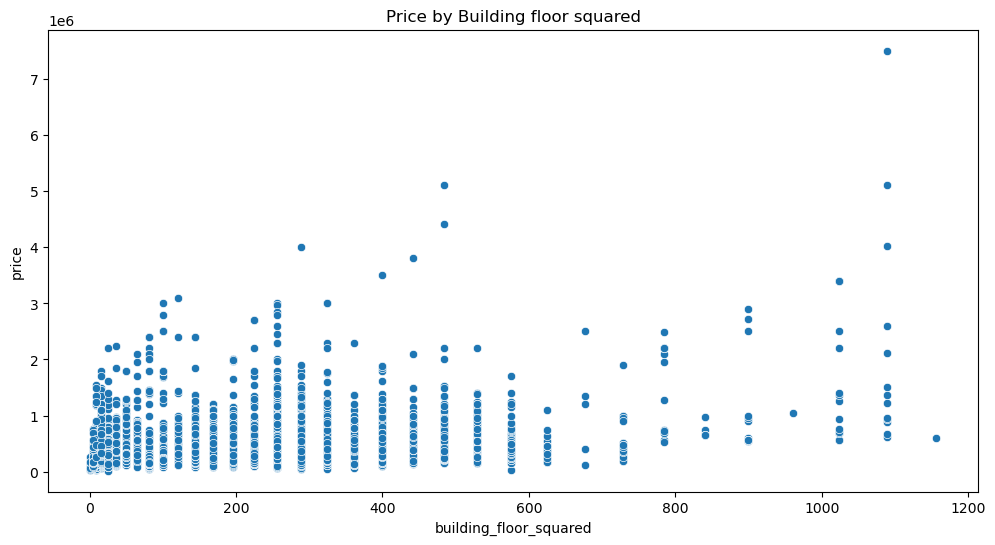

In [ ]:
# By building floor squared 

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'building_floor_squared', y = 'price')
plt.title('Price by Building floor squared')
plt.show()

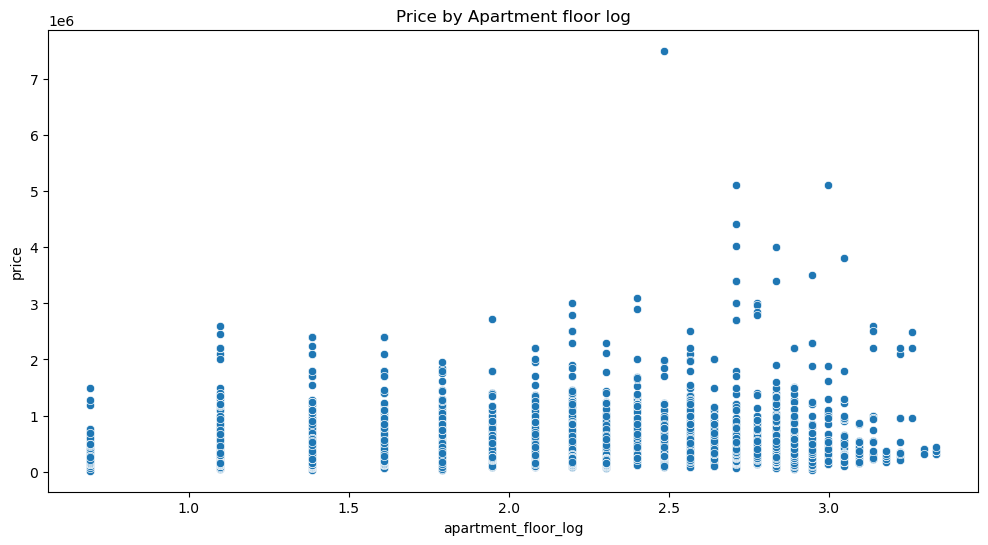

In [ ]:
# By apartment floor log

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'apartment_floor_log', y = 'price')
plt.title('Price by Apartment floor log')
plt.show()

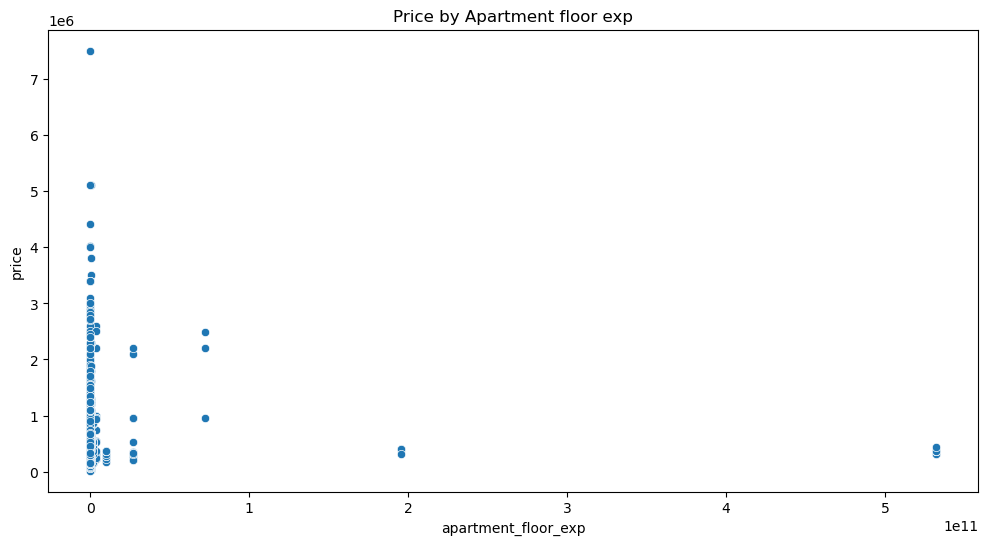

In [ ]:
# By Apartment floor exp

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'apartment_floor_exp', y = 'price')
plt.title('Price by Apartment floor exp')
plt.show()

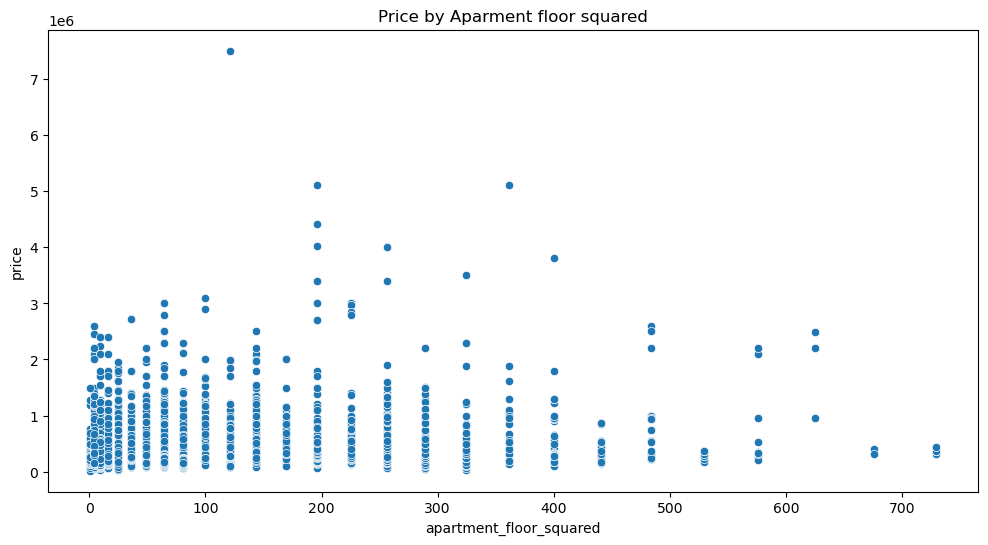

In [ ]:
# By Aparment floor squared 

plt.figure(figsize = (12,6))
sns.scatterplot(data = df_p, x = 'apartment_floor_squared', y = 'price')
plt.title('Price by Aparment floor squared')
plt.show()

In [ ]:
df_p.columns

Index(['room_number', 'title_deed', 'mortgage', 'repair', 'address',
       'apartment_floor', 'building_floor', 'category', 'price_azn_1m2',
       'area_m2', 'price', '28_May_m.', 'Elmlər_Nizami_Xətai_m.',
       'Gənclik_Nərimanov_m.', 'Nardaran_AgSheher_q.', 'Nərimanov_r.',
       'Sahil_m.', 'Səbail_Nəsimi_r.', 'Xətai_r.', 'İçəri_Şəhər_m.',
       'is_metro', 'is_town', 'total_ratio', 'total_value_per_m2',
       'room_number_log', 'room_number_exp', 'room_number_squared',
       'building_floor_log', 'building_floor_exp', 'building_floor_squared',
       'apartment_floor_log', 'apartment_floor_exp',
       'apartment_floor_squared'],
      dtype='object')

# Train-Test Split

In [ ]:
from sklearn.model_selection import train_test_split

X = df_p.drop(columns=['price', 'address', 'price_azn_1m2', 'total_value_per_m2'])
y = df_p['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, train_size = 0.8, random_state = 123)

# Model Selection

In [ ]:
# ✅ Linear Regression (if the data is linear)

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)


y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"📊 Linear Model Performance: ")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2 Score: {r2:.2f}")

📊 Linear Model Performance: 
MAE: 72816.91
RMSE: 149034.48
R2 Score: 0.67


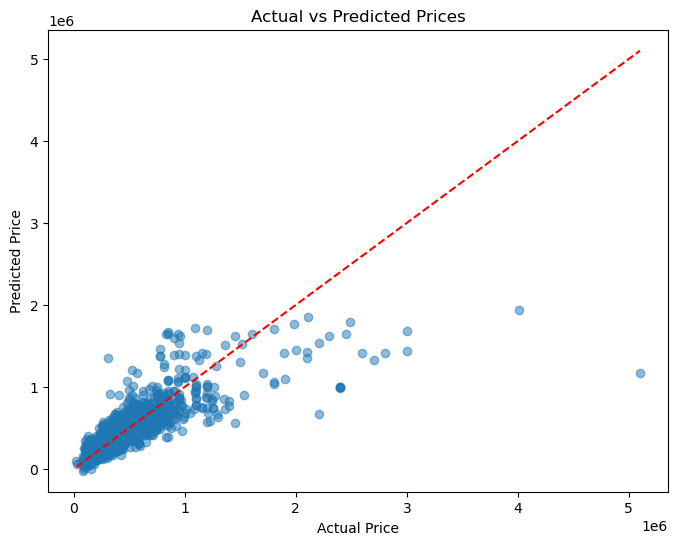

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle = 'dashed') # Perfect prediction line
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices")
plt.show()

In [ ]:
# ✅ Random Forest (for better non-linear performance)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators = 100, random_state = 123)
rf_model.fit(X_train, y_train)

rf_pred = rf_model.predict(X_test)

#Evaluate

rf_mae = mean_absolute_error(y_test, rf_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))
rf_r2 = r2_score(y_test, rf_pred)

print("📊 RandomForest Performance: ")
print(f"RF MAE: {rf_mae:.2f}")
print(f"RF RMSE: {rf_rmse:.2f}")
print(f"RF R2 Score: {rf_r2:.2f}")

📊 RandomForest Performance: 
RF MAE: 44609.53
RF RMSE: 110460.74
RF R2 Score: 0.82


In [ ]:
#✅ XGBoost (powerful gradient boosting model)

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

y_train = y_train.squeeze()
y_test = y_test.squeeze()

xgb_model = XGBRegressor(n_estimators=100, learning_rate = 0.1, random_state = 123)
xgb_model.fit(X_train, y_train)

xgb_pred = xgb_model.predict(X_test)

xgb_mae = mean_absolute_error(y_test, xgb_pred)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_pred))
xgb_r2 = r2_score(y_test, xgb_pred)

print("📊 XGBoost Performance: ")
print(f"XGBoost MAE: {xgb_mae:.2f}")
print(f"XGBoost RMSE: {xgb_rmse:.2f}")
print(f"XGBoost R2 Score: {xgb_r2:.2f}")

📊 XGBoost Performance: 
XGBoost MAE: 55281.00
XGBoost RMSE: 115804.84
XGBoost R2 Score: 0.80


In [ ]:
#✅ LightGBM 

In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 314)

model = LGBMRegressor(random_state = 314, n_estimators = 100, learning_rate = 0.1)

model.fit(X_train, y_train)


lgb_pred = model.predict(X_test)

lgbm_mae = mean_absolute_error(y_test, lgb_pred).round(2)
lgbm_rmse = np.sqrt(mean_squared_error(y_test, lgb_pred)).round(2)
lgbm_r2_score = r2_score(y_test, lgb_pred).round(2)

print('----------------------------------------------')
print(f'LGBM MAE: {lgbm_mae}')
print(f'LGBM RMSE: {lgbm_rmse}')
print(f'LGMB R2 Score: {lgbm_r2_score}')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 727
[LightGBM] [Info] Number of data points in the train set: 16060, number of used features: 29
[LightGBM] [Info] Start training from score 358864.512329
----------------------------------------------
LGBM MAE: 55265.57
LGBM RMSE: 103197.4
LGMB R2 Score: 0.83


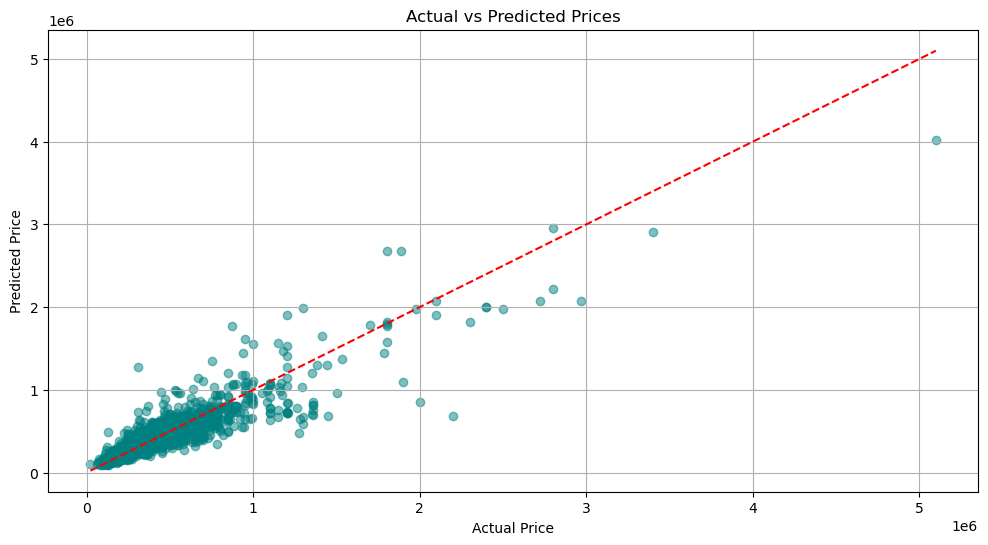

In [ ]:
plt.figure(figsize=(12,6))
plt.scatter(y_test, lgb_pred, alpha = 0.5, color = 'teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual vs Predicted Prices')
plt.grid(True)
plt.show()

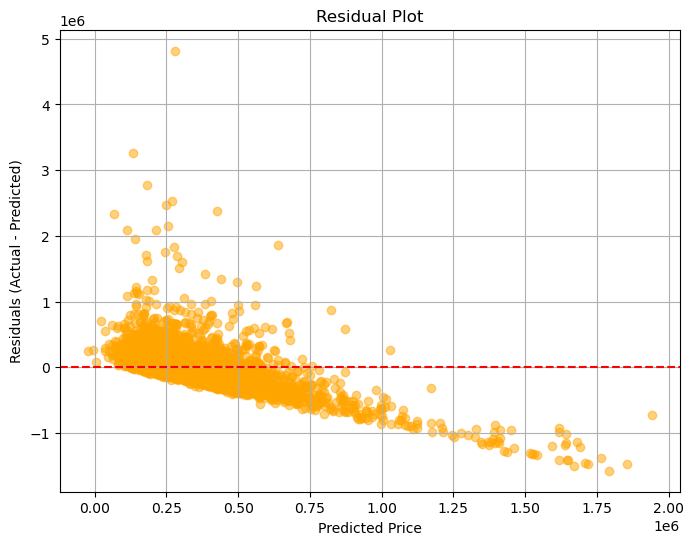

In [ ]:
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals, alpha=0.5, color='orange')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Price')
plt.ylabel('Residuals (Actual - Predicted)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()


# Compare Model Performance

In [ ]:
models = ['LinearRegression', 'RandomForest', 'XGBoost', 'LightGBM']

mae_scores = [mae, rf_mae, xgb_mae, lgbm_mae]
rmse_scores = [rmse, rf_rmse, xgb_rmse, lgbm_rmse]
r2_scores = [r2, rf_r2, xgb_r2, lgbm_r2_score]

comparison_df = pd.DataFrame({"Model" : models, "MAE" : mae_scores, "RMSE" : rmse_scores, "R2" : r2_scores})
print(comparison_df.sort_values(by="R2", ascending=False).round(2))

              Model       MAE       RMSE    R2
3          LightGBM  55265.57  103197.40  0.83
1      RandomForest  44609.53  110460.74  0.82
2           XGBoost  55281.00  115804.84  0.80
0  LinearRegression  72816.91  149034.48  0.67


In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split
from lightgbm import LGBMRegressor

In [ ]:
param_grid = {
#    'num_leaves' : [20, 31, 40],
    'max_depth' : [-1, 5, 10],
    'learning_rate' : [0.01, 0.05],
#    'n_estimators' : [100, 200, 500],
#    'min_child_samples' : [10, 20, 30],
#    'subsample' : [0.6, 0.8, 1],
#    'colsample_bytree' : [0.6, 0.8, 1]
}

In [ ]:
lgb_model = LGBMRegressor(random_state = 314)

grid_search = GridSearchCV(
        estimator = lgb_model,
        param_grid = param_grid,
        cv = 3,
        n_jobs = -1,
        verbose = 1,
        scoring = 'neg_mean_squared_error'
)

grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 727
[LightGBM] [Info] Number of data points in the train set: 16060, number of used features: 29
[LightGBM] [Info] Start training from score 358864.512329


GridSearchCV(cv=3, estimator=LGBMRegressor(random_state=314), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05],
                         'max_depth': [-1, 5, 10]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print('Best parameters: ', grid_search.best_params_)
print('Best score (neg MSE): ', grid_search.best_score_)

Best parameters:  {'learning_rate': 0.05, 'max_depth': -1}
Best score (neg MSE):  -16048342041.229948


In [ ]:
best_model = grid_search.best_estimator_
lg_pred = best_model.predict(X_test)

In [ ]:
mse_lgb = mean_squared_error(y_test, lg_pred)
np.sqrt(mse_lgb).round()

105416.0

In [ ]:
df_res = pd.DataFrame({'target': y_test, 'prediction': lg_pred.round()})

In [ ]:
df_res['diff'] = (df_res['target']-df_res['prediction']).abs()

In [ ]:
df_res = df_res.drop(35064, axis=0)
df_res.sort_values('diff', ascending=False)

,target,prediction,diff
34350,2200000,954306.0,1245694.0
34746,2000000,813964.0,1186036.0
10294,310000,1375602.0,1065602.0
34724,2965000,1991176.0,973824.0
29276,870000,1692732.0,822732.0
1404,1275000,498482.0,776518.0
35183,1900000,1125220.0,774780.0
34563,950000,1707150.0,757150.0
31126,1280000,553338.0,726662.0
30147,1300000,592373.0,707627.0


In [ ]:
mse_l = mean_squared_error(df_res.target, df_res.prediction)
r2l_score = r2_score(df_res.target, df_res.prediction)
print(r2l_score.round(2))
print(np.sqrt(mse_l).round())

0.82
102033.0


In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


In [ ]:
mean_absolute_percentage_error(df_res.target, df_res.prediction).round(2)

15.16

In [ ]:
df_res.head(20)

,target,prediction,diff
25020,295000,295793.0,793.0
45027,183000,201376.0,18376.0
15788,259000,300682.0,41682.0
41689,109000,135159.0,26159.0
8470,257000,261747.0,4747.0
11845,208000,238298.0,30298.0
41826,250000,246578.0,3422.0
21122,612000,548172.0,63828.0
30147,1300000,592373.0,707627.0
19255,435000,382161.0,52839.0


In [ ]:
import pickle

with open('model.pkl', 'wb') as file:
    pickle.dump(model, file)

In [ ]:
best_model.feature_names_in_

array(['room_number', 'title_deed', 'mortgage', 'repair',
       'apartment_floor', 'building_floor', 'category', 'area_m2',
       '28_May_m.', 'Elmlər_Nizami_Xətai_m.', 'Gənclik_Nərimanov_m.',
       'Nardaran_AgSheher_q.', 'Nərimanov_r.', 'Sahil_m.',
       'Səbail_Nəsimi_r.', 'Xətai_r.', 'İçəri_Şəhər_m.', 'is_metro',
       'is_town', 'total_ratio', 'room_number_log', 'room_number_exp',
       'room_number_squared', 'building_floor_log', 'building_floor_exp',
       'building_floor_squared', 'apartment_floor_log',
       'apartment_floor_exp', 'apartment_floor_squared'], dtype='<U23')